# Plotting for duplicate bridges

Jupyter NB on plotting the duplicate bridges (before and after)

In [1]:
# Loading librabries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import contextily as ctx
import geopandas as gpd


In [2]:
# Load the raw data
path = './WBSIM_Lab1_2024/infrastructure/'
file_name = 'BMMS_overview.xlsx'
raw_data = pd.read_excel(path + file_name, na_values='.')
raw_data.describe().T

,count,mean,std,min,25%,50%,75%,max
km,21406.0,41.217405,78.810955,0.00,6.207250,15.147000,35.012250,522.718000
length,21398.0,16.625390,43.859460,0.20,2.680000,5.600000,15.800000,1786.000000
structureNr,21407.0,110961.360676,6319.200562,100001.00,105466.500000,110978.000000,116441.500000,121862.000000
width,18290.0,7.813633,6.193465,1.38,5.000000,7.300000,9.700000,702.000000
constructionYear,18289.0,1990.171961,10.123705,1942.00,1985.000000,1992.000000,1998.000000,2013.000000
spans,18290.0,1.465500,1.179609,1.00,1.000000,1.000000,1.000000,31.000000
lat,21313.0,23.828505,2.247895,0.00,22.942527,23.823743,24.720939,91.544194
lon,21313.0,90.227328,3.364169,0.00,89.377806,90.289194,91.288417,93.298416


## Function for Plotting Bridges on satellite map

In [34]:
def plot_bridge_locations(df, subset, color='red'):
    """
    Plot the locations of bridges in a GeoDataFrame on a satellite map. Input variables are the dataframe and a list of indices to plot.
    """
    # Validate subset indices
    valid_subset = [i for i in subset if i in df.index]
    if not valid_subset:
        print("No valid indices to plot.")
        return

    # Convert dataframe to GeoDataFrame
    gdf = gpd.GeoDataFrame(df.copy(), geometry=gpd.points_from_xy(df['lon'], df['lat']))
    gdf = gdf.set_crs(epsg=4326).to_crs(epsg=3857)  # Convert to Web Mercator for contextily

    # Filter for valid indices
    gdf_subset = gdf.loc[valid_subset]

    # Plot the filtered data on a satellite map
    ax = gdf_subset.plot(figsize=(10, 10), color=color, alpha=0.7, markersize=100)
    ax.set_xlim(ax.get_xlim()[0] - 750, ax.get_xlim()[1] + 750)  # zoom out
    ax.set_ylim(ax.get_ylim()[0] - 750, ax.get_ylim()[1] + 750)  # zoom out
    ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery) # Stamen.TonerLite ; Esri.WorldImagery

    # Add bridge names as labels with offset to avoid overlap
    for idx, row in gdf_subset.iterrows():
        plt.text(row.geometry.x, row.geometry.y + 100, s=row['name'], fontsize=10, color='white',
                 ha='center', va='bottom', bbox=dict(facecolor='black', alpha=0.5))

    plt.title(f'Bridge Locations for Indices {valid_subset} on Satellite Map')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.tight_layout()
    plt.savefig(f'bridge_locations_{subset}_{color}.png')
    plt.show()

## 3 Cases of presumably duplicate bridges

In [26]:
df = raw_data.copy()

,road,km,type,LRPName,name,length,condition,structureNr,roadName,chainage,...,spans,zone,circle,division,sub-division,lat,lon,EstimatedLoc,dup_code,EstimatedLoc_score
8,N1,12.660,PC Girder Bridge,LRP013a,Madanpur Bridge.(L),27.5,A,119897,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,12.66,...,NaN,Dhaka,Dhaka,Narayanganj,Vitikandi,23.685500,90.551278,road_precise,LRP013aMADANVitikandi,5
9,N1,12.660,PC Girder Bridge,LRP013a,MADAN PUR (R),26.3,A,109841,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,12.66,...,1.0,Dhaka,Dhaka,Narayanganj,Vitikandi,23.691111,90.544889,bcs1,LRP013aMADANVitikandi,4
10,N1,12.660,PC Girder Bridge,LRP013a,MADANPUR BRIDGE(L),26.3,A,109838,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,12.66,...,1.0,Dhaka,Dhaka,Narayanganj,Vitikandi,23.691111,90.544889,bcs1,LRP013aMADANVitikandi,4
11,N1,12.688,PC Girder Bridge,LRP013b,Madanpur Bridge(R),27.5,A,119900,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,12.688,...,NaN,Dhaka,Dhaka,Narayanganj,Vitikandi,23.685362,90.551359,road_interpolate,LRP013bMADANVitikandi,3


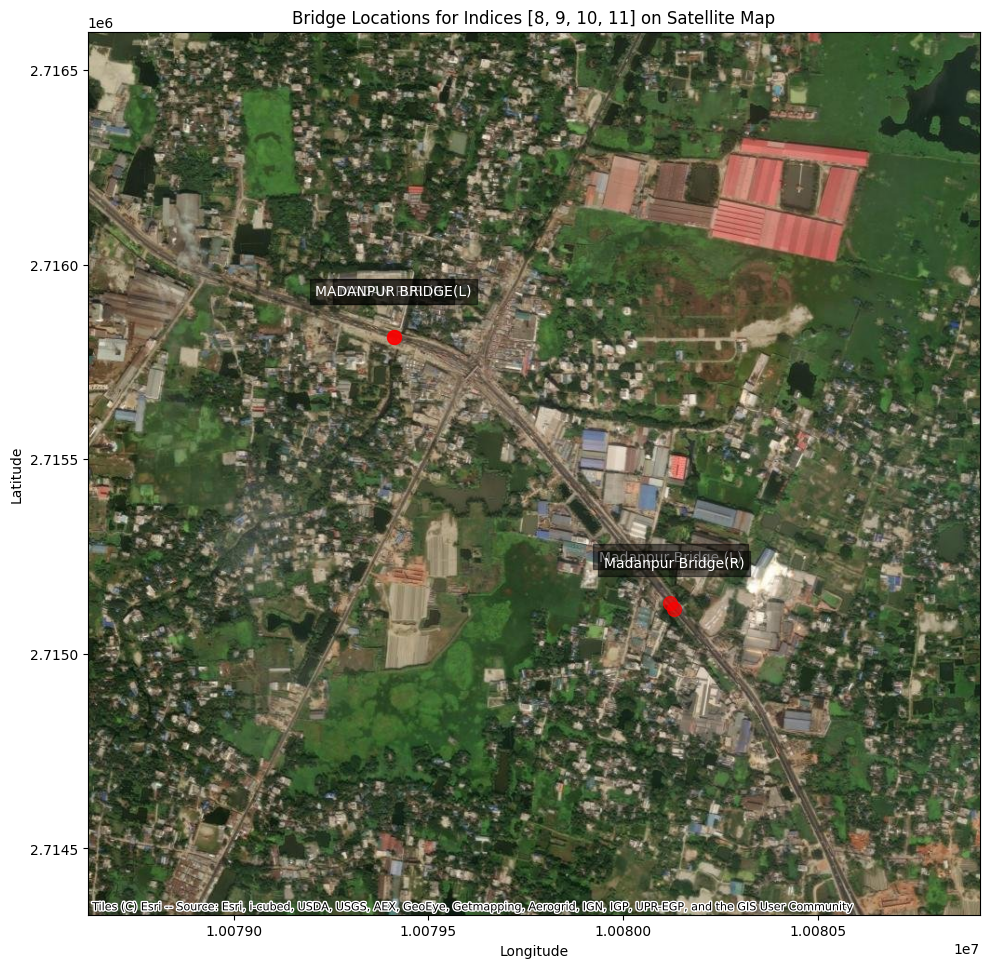

In [42]:
# Case 1: Madanpur Bridge(s)
case1 = [ 8, 9, 10, 11]

display(df.loc[case1])
plot_bridge_locations(df, case1)

,road,km,type,LRPName,name,length,condition,structureNr,roadName,chainage,width,constructionYear,spans,zone,circle,division,sub-division,lat,lon,EstimatedLoc
20,N1,22.596,PC Girder Bridge,LRP023a,ASHIR CHAR (Right),224.80,A,109820,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,22.596,9.15,2004.0,9.0,Dhaka,Dhaka,Narayanganj,Vitikandi,23.624278,90.605472,bcs1
21,N1,23.081,PC Girder Bridge,LRP023d,Asharirchar-2 Bridge.(R),119.32,A,119964,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,23.081,NaN,NaN,NaN,Dhaka,Dhaka,Narayanganj,Vitikandi,23.613587,90.610903,road_interpolate
22,N1,23.081,PC Girder Bridge,LRP023c,Ashariachar-2 Bridge.(L),119.48,A,119961,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,23.081,NaN,NaN,NaN,Dhaka,Dhaka,Narayanganj,Vitikandi,23.613587,90.610903,road_interpolate
23,N1,23.081,PC Girder Bridge,LRP023c,ASHARIR CHAR (L),120.10,A,109796,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,23.081,9.50,2000.0,4.0,Dhaka,Dhaka,Narayanganj,Vitikandi,23.620528,90.607917,bcs1


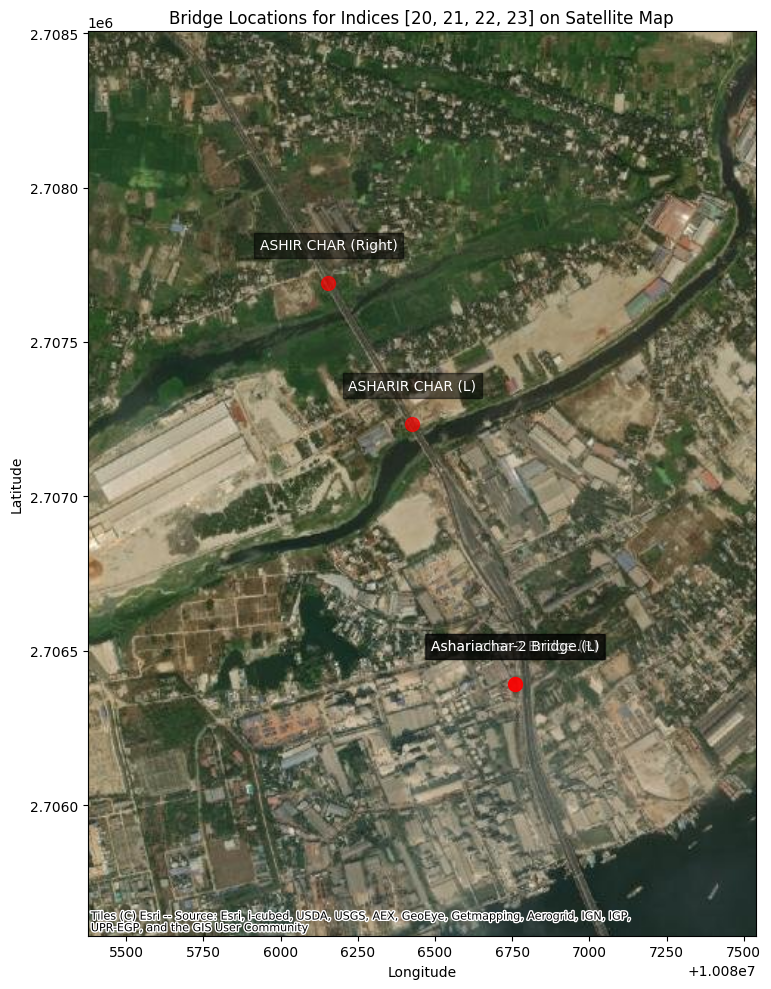

In [36]:
# Case 2: Asharirchar Bridge(s)
case2 = [20, 21, 22, 23]

display(df.loc[case2])
plot_bridge_locations(df, case2)

,road,km,type,LRPName,name,length,condition,structureNr,roadName,chainage,width,constructionYear,spans,zone,circle,division,sub-division,lat,lon,EstimatedLoc
17,N1,21.184,PC Girder Bridge,LRP021c,Marikhali Bridge(L),86.92,A,119944,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,21.184,NaN,NaN,NaN,Dhaka,Dhaka,Narayanganj,Vitikandi,23.628467,90.602302,road_interpolate
18,N1,21.184,PC Girder Bridge,LRP021d,Marikhali Bridge(R),89.75,A,119948,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,21.184,NaN,NaN,NaN,Dhaka,Dhaka,Narayanganj,Vitikandi,23.628467,90.602302,road_interpolate
19,N1,21.184,PC Girder Bridge,LRP021c,MARIKHALL BRIDGE,89.20,A,101103,Dhaka (Jatrabari)-Comilla (Mainamati)-Chittago...,21.184,9.2,2000.0,3.0,Dhaka,Dhaka,Narayanganj,Vitikandi,23.634167,90.596889,bcs1


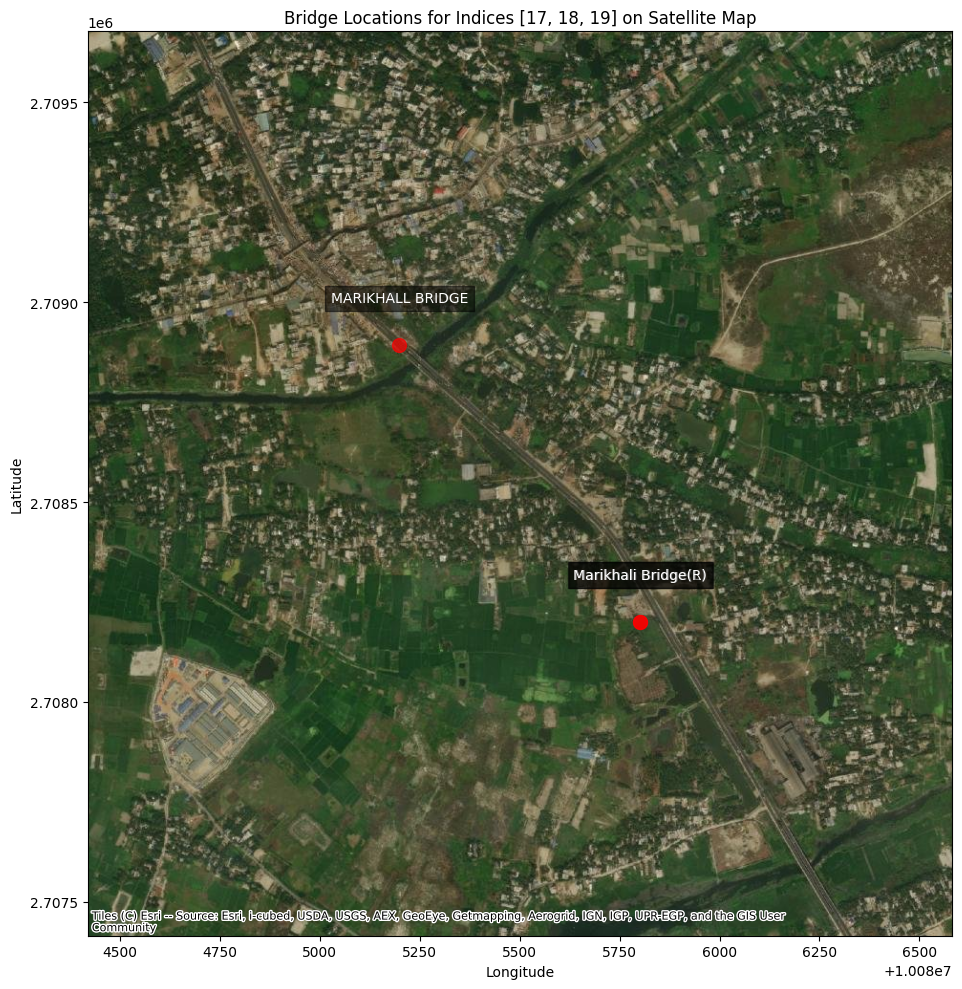

In [37]:
# Case 3: Marikhali Bridge(s)
case3 = [17, 18, 19]

display(df.loc[case3])
plot_bridge_locations(df, case3)


# Algorithm used for finding duplicates 

In [38]:
df = raw_data.copy() 

# Make new column based in LRPName, first 3 letters of name and sub-division. Helps checking for the duplicates
df['dup_code'] = df['LRPName'].astype('str') + df['name'].str.extract(r'(\w{5})')[0].str.upper().fillna('x') + df['sub-division'].astype('str')

# Define the preference order as a dictionary, the data originating from certain datasets is preferred over others
preference_order = {
    'road_chainage': 6,
    'road_precise': 5,
    'bcs1': 4,
    'road_interpolate': 3,
    'bcs1_zerosec': 2,
    'error': 1
}

# Create a new column to assign scores based on the EstimatedLoc preference
df['EstimatedLoc_score'] = df['EstimatedLoc'].map(preference_order)
df.head()

# Sort the dataframe by 'dup_code' and 'loc_score' so the highest preference comes first
df_sorted = df.sort_values(by=['dup_code', 'EstimatedLoc_score'], ascending=[True, False])

# Drop duplicates based on 'dup_code', keeping the first occurrence (which has the highest loc_score)
df_cleaned = df_sorted.drop_duplicates(subset='dup_code', keep='first')

# Drop the temporary 'loc_score' column as it's no longer needed
df_notsorted = df_cleaned.drop(['EstimatedLoc_score', 'dup_code'], axis=1)

# Sort the DataFrame by its index in ascending order
df_final = df_notsorted.sort_index()

# Plot bridges again, based on data cleaned for duplicates 

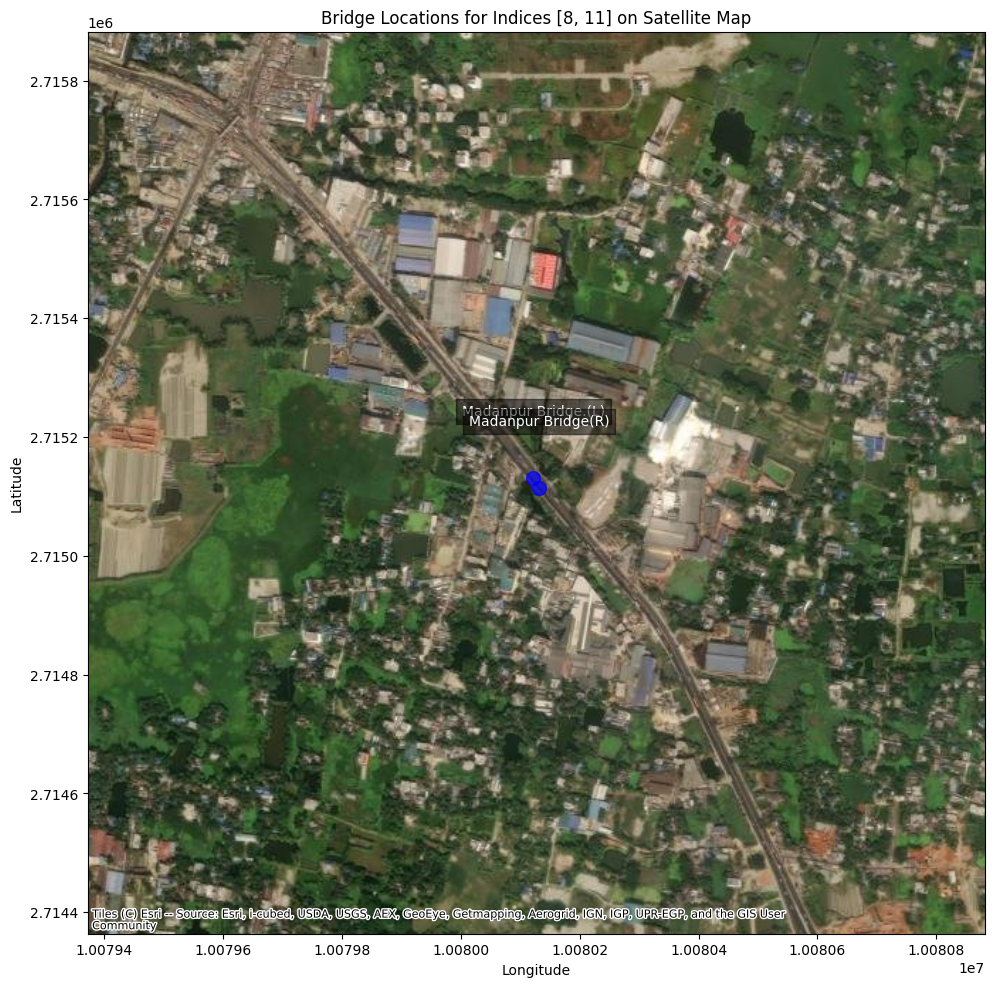

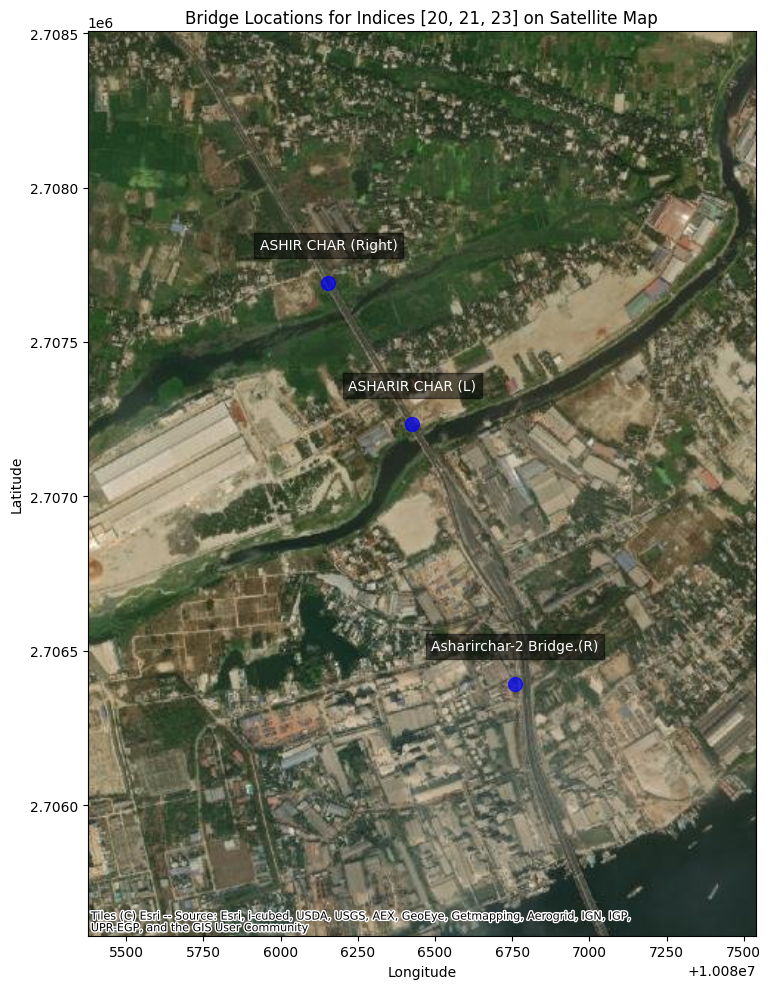

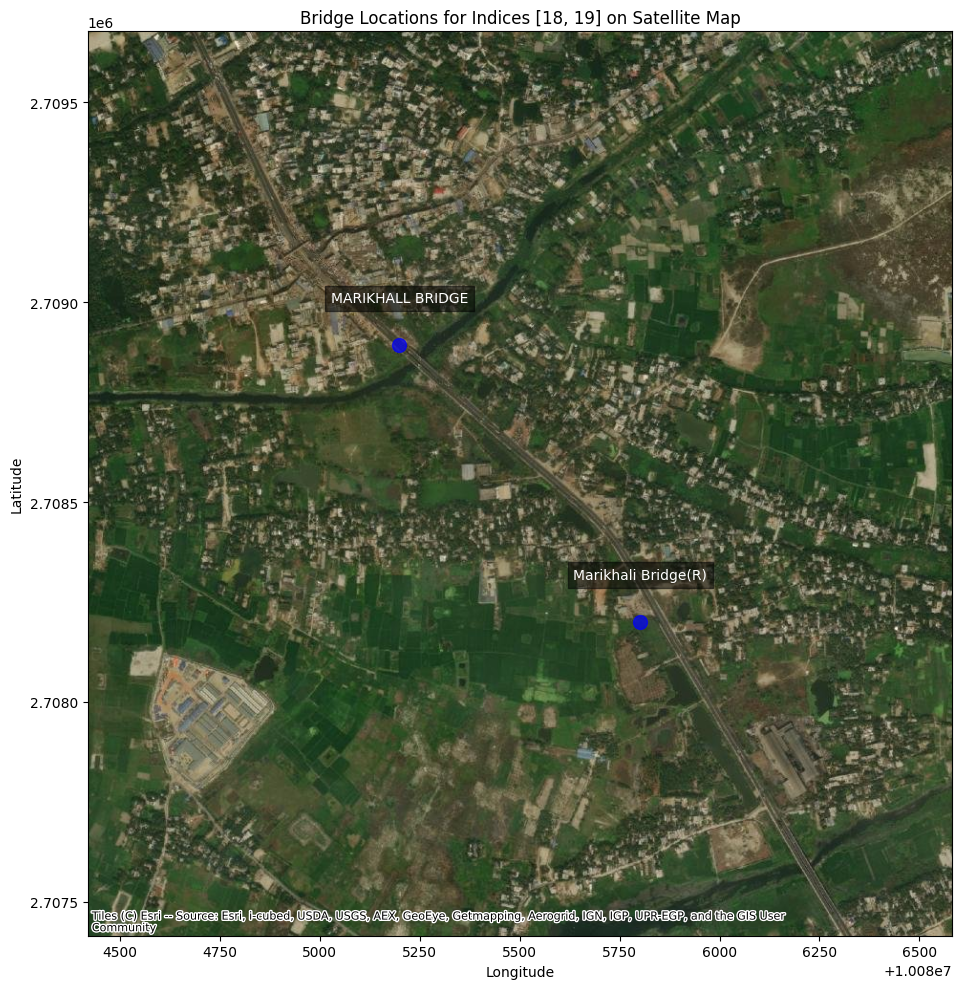

In [39]:
for case in [case1, case2, case3]:
    plot_bridge_locations(df_final, case, color='blue')